In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tables
import h5py
from scipy.spatial.distance import pdist, squareform
import os

# Simulation
+ JSAP version: 547
+ Energy: 2 MeV
+ Geo: 1 t
+ Simulation: (0,z/5,z): z from -0.65 to 0.65 m, step 0.01 m
+ 20k events per point

In [2]:
# example of read 1 file
def main(path,axis):
    for i,file in enumerate(np.arange(-0.6001,0.60,0.05)):

        h = tables.open_file('../%s/1t_%+.3f_%s.h5' % (path, file, axis),'r')
        recondata = h.root.Recon
        E1 = recondata[:]['E_sph_in']
        x1 = recondata[:]['x_sph_in']
        y1 = recondata[:]['y_sph_in']
        z1 = recondata[:]['z_sph_in']
        L1 = recondata[:]['Likelihood_in']
        s1 = recondata[:]['success_in']
        
        E2 = recondata[:]['E_sph_out']
        x2 = recondata[:]['x_sph_out']
        y2 = recondata[:]['y_sph_out']
        z2 = recondata[:]['z_sph_out']
        L2 = recondata[:]['Likelihood_out']
        s2 = recondata[:]['success_out']
        
        data = np.zeros((np.size(x1),3))
        
        index = L1 < L2
        data[index,0] = x1[index]
        data[index,1] = y1[index]
        data[index,2] = z1[index]

        data[~index,0] = x2[~index]
        data[~index,1] = y2[~index]
        data[~index,2] = z2[~index]

        xt = recondata[:]['x_truth'][0]
        yt = recondata[:]['y_truth'][0]
        zt = recondata[:]['z_truth'][0]

        x = data[(s1 * s2)!=0,0]
        y = data[(s1 * s2)!=0,1]
        z = data[(s1 * s2)!=0,2]
        
        
        r = np.sqrt(x**2 + y**2 + z**2)
        index = (r<0.64) & (r>0.01) & (~np.isnan(r))
        H1, xedges, yedges = np.histogram2d(x[index]**2 + y[index]**2, z[index], bins=50)
        X, Y = np.meshgrid(xedges[1:],yedges[1:])
        plt.figure(dpi=200)
        plt.contourf(X,Y,np.log(np.transpose(H1)+1))
        plt.colorbar()
        plt.xlabel(r'$x^2 + y^2/m^2$')
        plt.ylabel('$z$/m')
        plt.title('axis = %s, radius=%+.2fm' % (axis,file))
        plt.savefig('./fig/Scatter_1MeV%+.2f_%s.pdf' % (file,axis))
        plt.show()
        #index1 = (~index) & (~np.isnan(x2))
        #plt.hist(np.nan_to_num(np.sqrt(data[index1,0]**2 + data[index1,1]**2 + data[index1,2]**2)),bins=100)
        #plt.show()
        plt.figure(dpi=200)
        index2 = index
        #index2 = index
        plt.hist(np.sqrt(x[index2]**2+y[index2]**2+z[index2]**2), bins=100,label='recon')
        plt.axvline(np.abs(file) * np.sqrt(26)/5, color='red', label='real')
        plt.axvline(0.88 * 0.65,color='green',linewidth=1,label='bound')
        plt.xlabel('Recon radius/m')
        plt.ylabel('Num')
        plt.legend()
        recon = eval(axis)
        plt.title('axis = %s, Radius=%+.2fm, std = %.4fm' % (axis, file, np.std(recon[index2]-np.abs(file) * np.sqrt(26)/5)))
        plt.savefig('./fig/HistR_1MeV%+.2f_%s.pdf' % (file,axis))
        #plt.show()
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','x')
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','y')
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','z')

main('result_1t_2.0MeV_dns_Recon_1t_10','x')
main('result_1t_2.0MeV_dns_Recon_1t_10','y')
main('result_1t_2.0MeV_dns_Recon_1t_10','z')

OSError: ``../result_1t_2.0MeV_dns_Recon_1t_10/1t_-0.600_x.h5`` does not exist

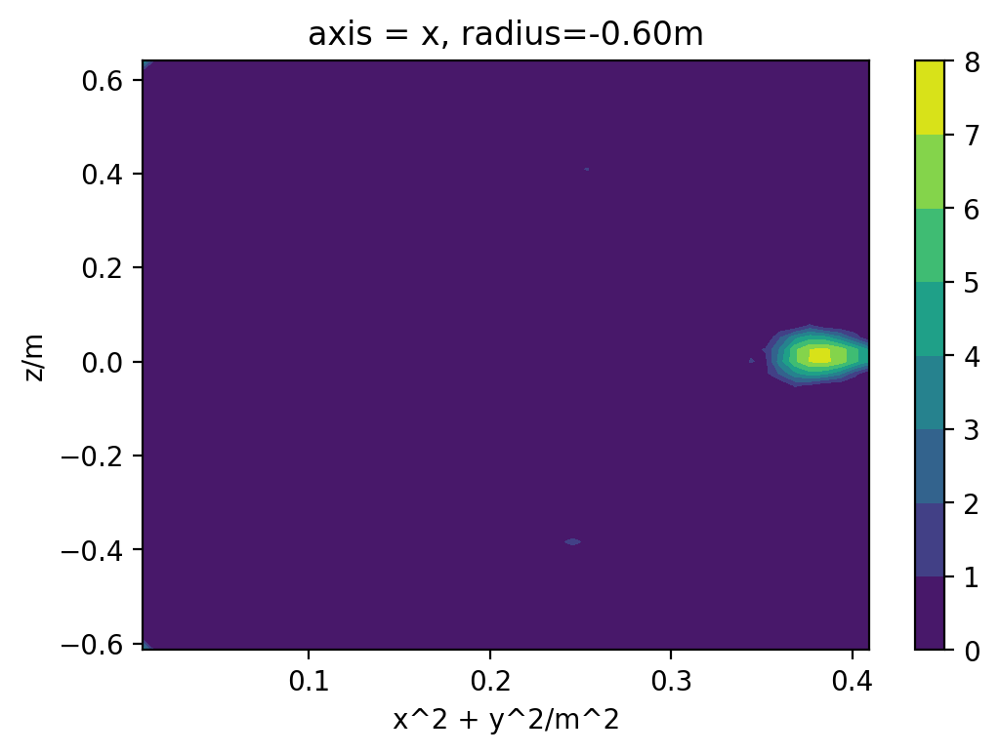

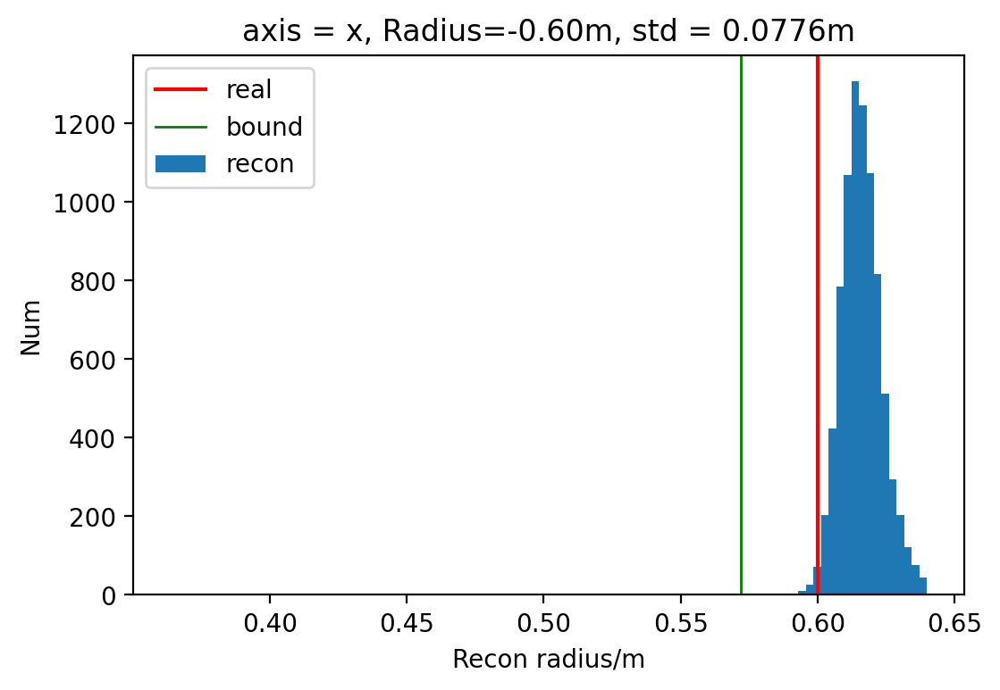

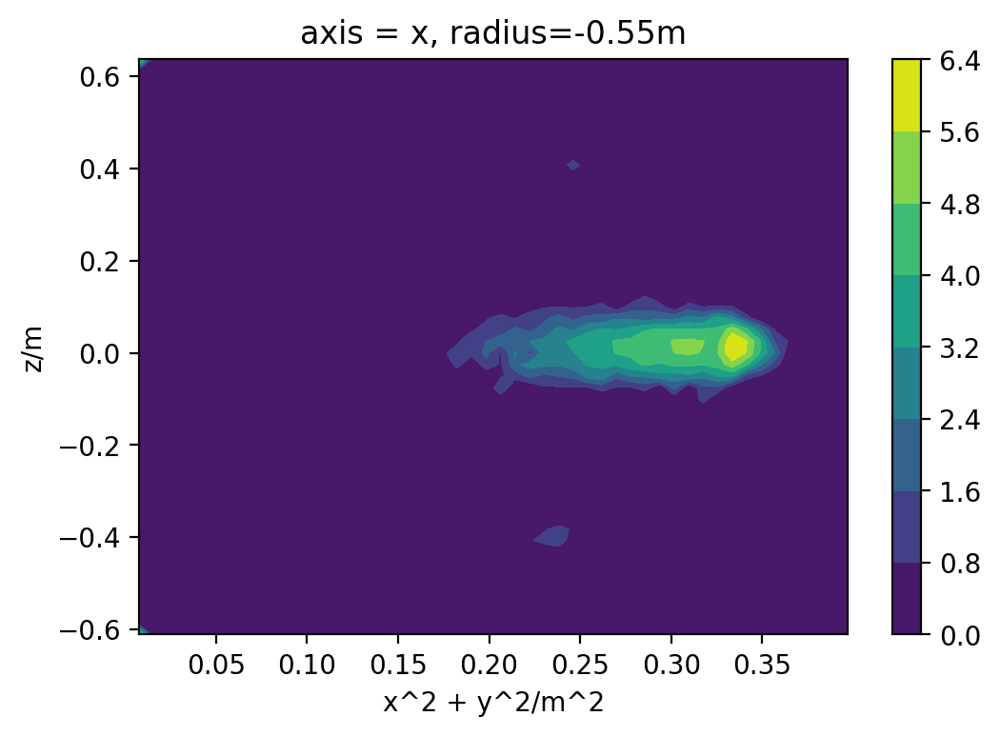

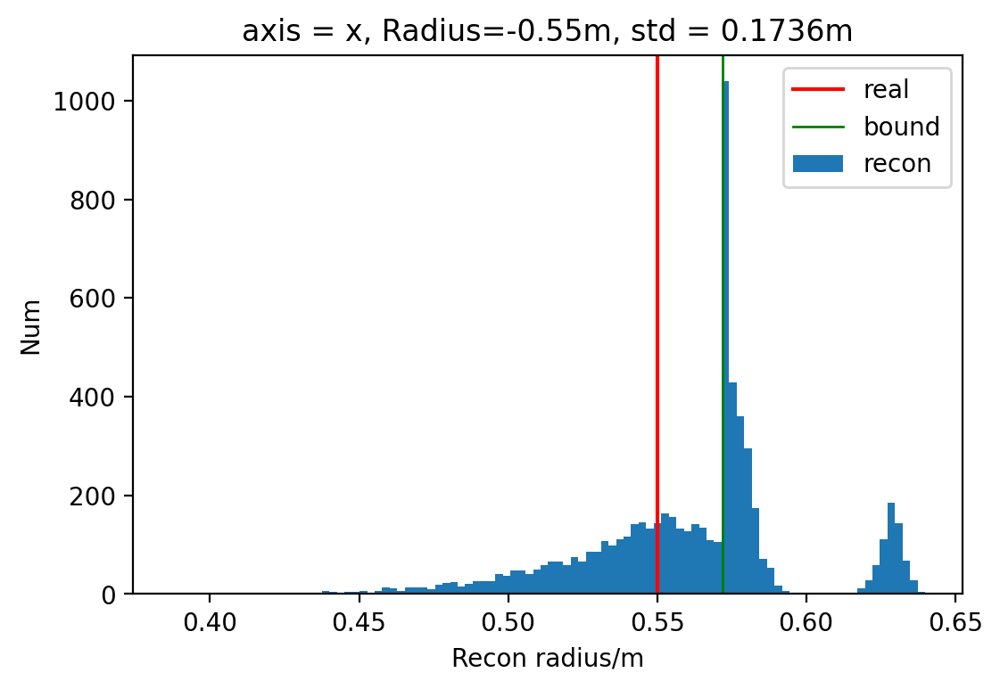

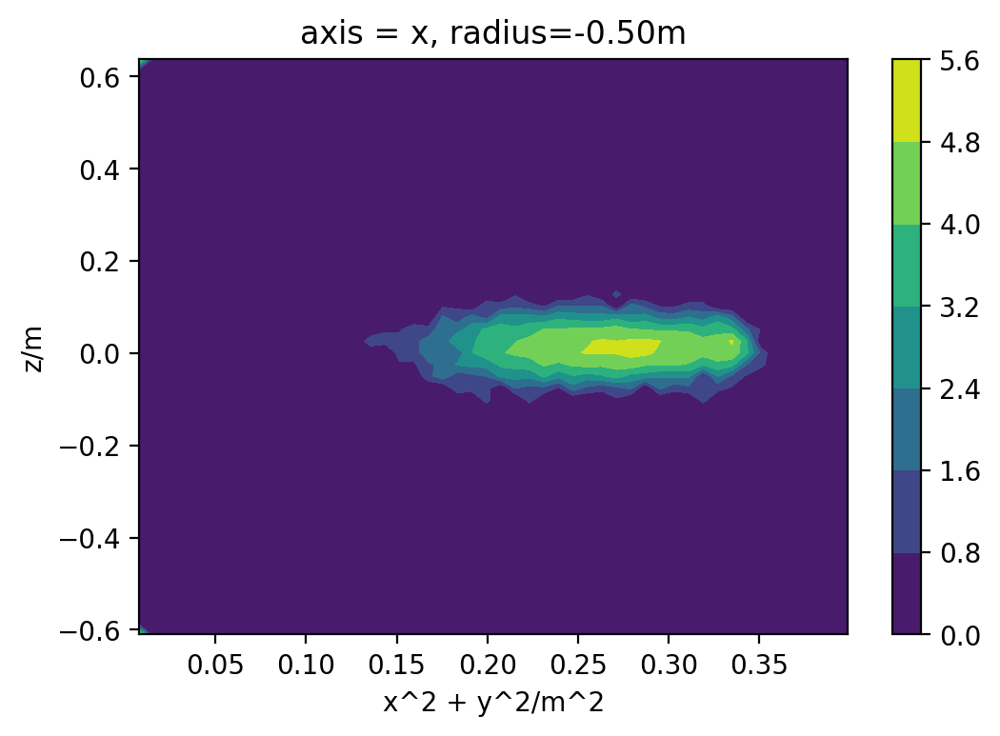

...

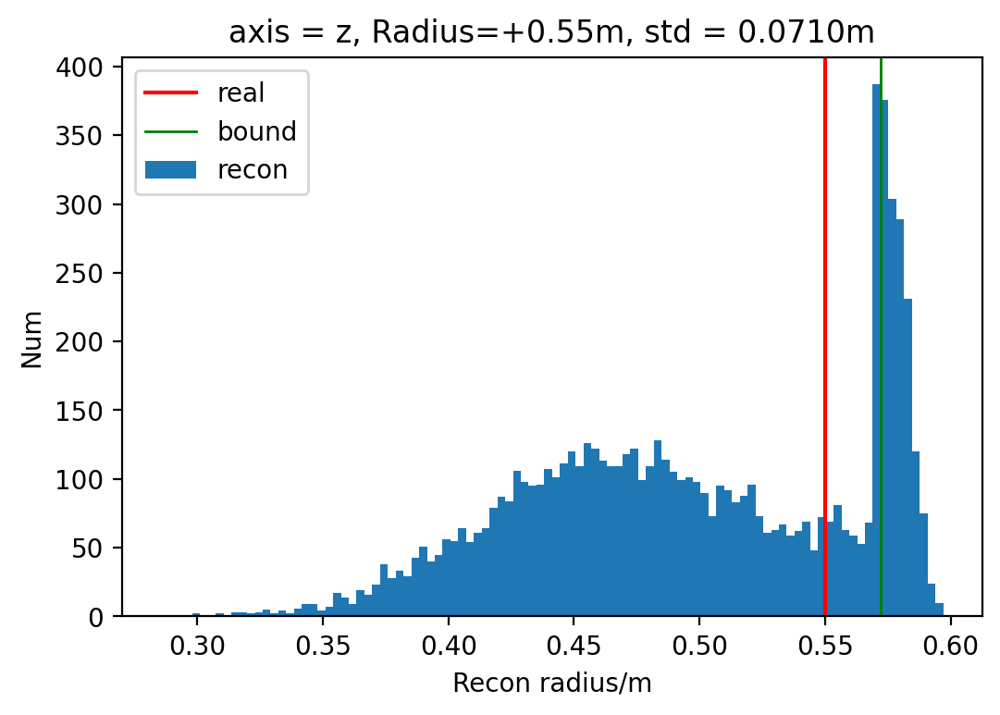

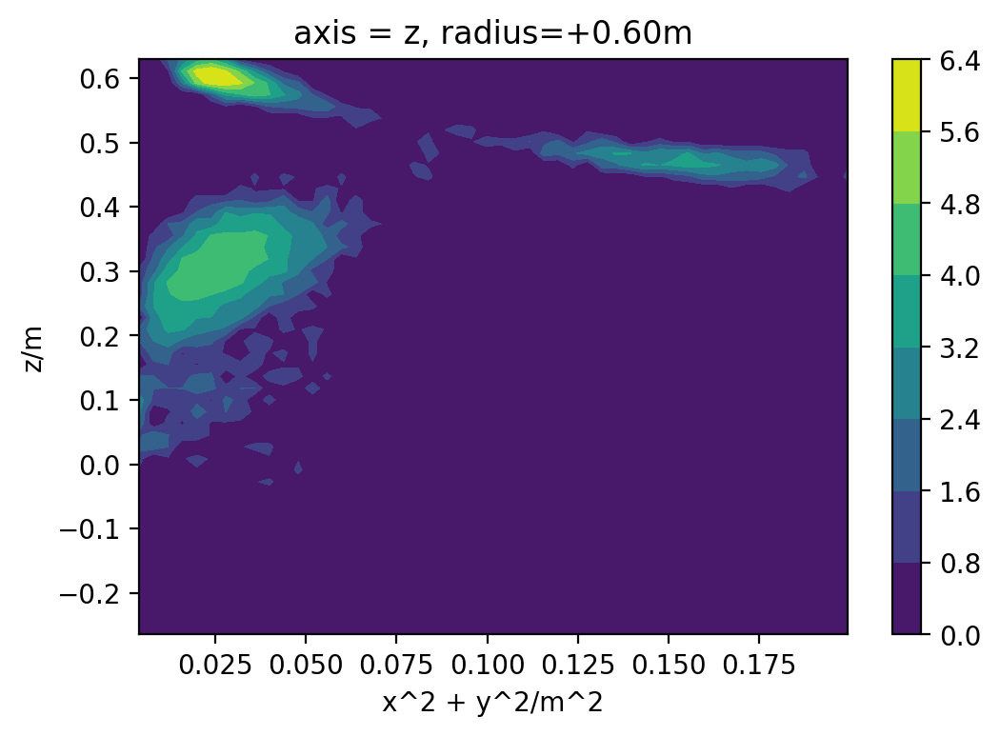

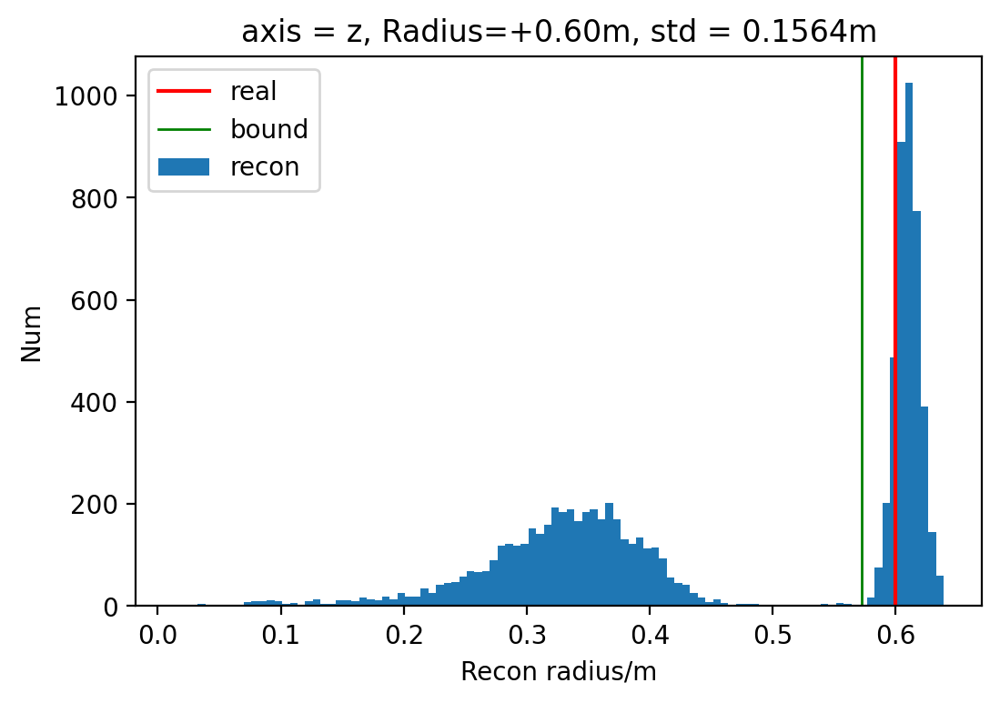

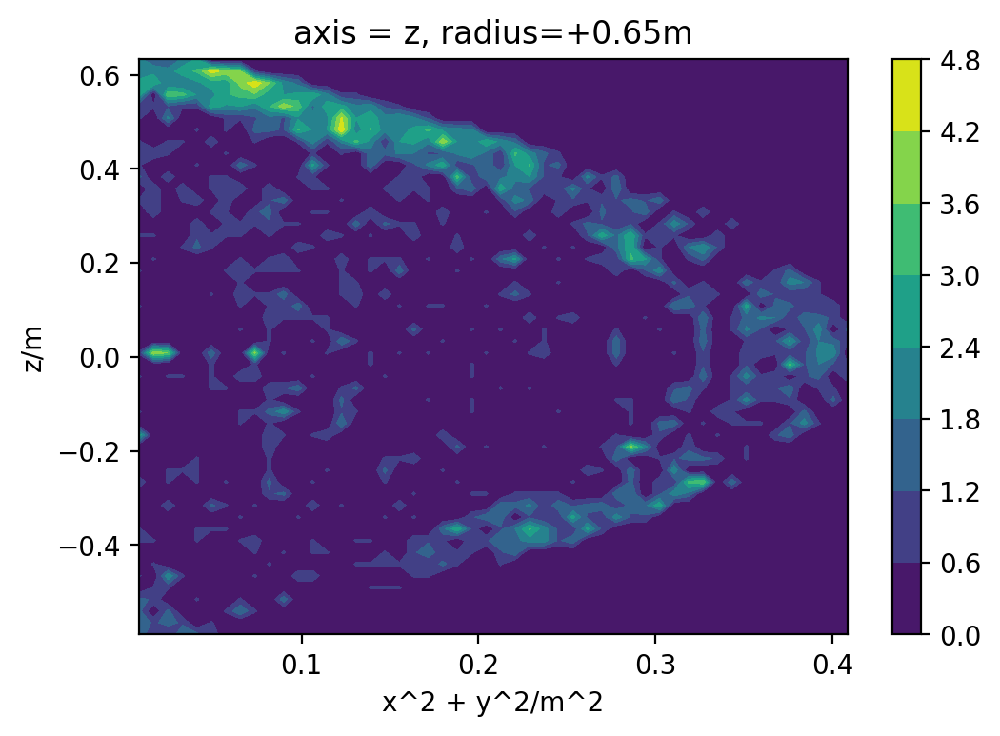

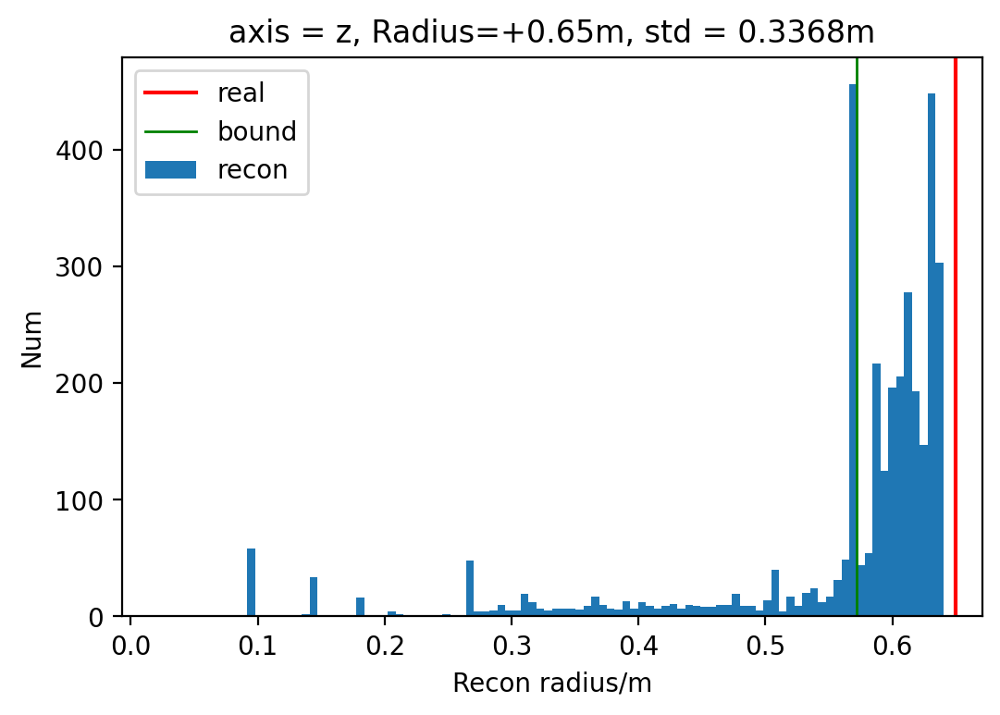

In [128]:
# example of read 1 file
def main(path,axis):
    for i,file in enumerate(np.arange(-0.6001,0.65,0.05)):

        h = tables.open_file('../%s/1t_%+.3f_%s.h5' % (path, file, axis),'r')
        recondata = h.root.Recon
        E1 = recondata[:]['E_sph_in']
        x1 = recondata[:]['x_sph_in']
        y1 = recondata[:]['y_sph_in']
        z1 = recondata[:]['z_sph_in']
        L1 = recondata[:]['Likelihood_in']
        s1 = recondata[:]['success_in']
        
        E2 = recondata[:]['E_sph_out']
        x2 = recondata[:]['x_sph_out']
        y2 = recondata[:]['y_sph_out']
        z2 = recondata[:]['z_sph_out']
        L2 = recondata[:]['Likelihood_out']
        s2 = recondata[:]['success_out']
        
        data = np.zeros((np.size(x1),3))
        
        index = L1 < L2
        data[index,0] = x1[index]
        data[index,1] = y1[index]
        data[index,2] = z1[index]

        data[~index,0] = x2[~index]
        data[~index,1] = y2[~index]
        data[~index,2] = z2[~index]

        xt = recondata[:]['x_truth'][0]
        yt = recondata[:]['y_truth'][0]
        zt = recondata[:]['z_truth'][0]

        x = data[(s1 * s2)!=0,0]
        y = data[(s1 * s2)!=0,1]
        z = data[(s1 * s2)!=0,2]
        
        
        r = np.sqrt(x**2 + y**2 + z**2)
        index = (r<0.64) & (r>0.01) & (~np.isnan(r))
        H1, xedges, yedges = np.histogram2d(x[index]**2 + y[index]**2, z[index], bins=50)
        X, Y = np.meshgrid(xedges[1:],yedges[1:])
        plt.figure(dpi=200)
        plt.contourf(X,Y,np.log(np.transpose(H1)+1))
        plt.colorbar()
        plt.xlabel('x^2 + y^2/m^2')
        plt.ylabel('z/m')
        plt.title('axis = %s, radius=%+.2fm' % (axis,file))
        plt.savefig('./fig/Scatter_1MeV%+.2f_%s.png' % (file,axis))
        plt.show()
        #index1 = (~index) & (~np.isnan(x2))
        #plt.hist(np.nan_to_num(np.sqrt(data[index1,0]**2 + data[index1,1]**2 + data[index1,2]**2)),bins=100)
        #plt.show()
        plt.figure(dpi=200)
        index2 = index
        #index2 = index
        plt.hist(np.sqrt(x[index2]**2+y[index2]**2+z[index2]**2), bins=100,label='recon')
        plt.axvline(np.abs(file), color='red', label='real')
        plt.axvline(0.88 * 0.65,color='green',linewidth=1,label='bound')
        plt.xlabel('Recon radius/m')
        plt.ylabel('Num')
        plt.legend()
        recon = eval(axis)
        plt.title('axis = %s, Radius=%+.2fm, std = %.4fm' % (axis, file, np.std(recon[index2]-zt)))
        plt.savefig('./fig/HistR_1MeV%+.2f_%s.png' % (file,axis))
        #plt.show()
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','x')
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','y')
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','z')

main('result_1t_2.0MeV_dns','x')
main('result_1t_2.0MeV_dns','y')
main('result_1t_2.0MeV_dns','z')

In [ ]:
def readfile(path):
    #path = r'../result_1t_1MeV_new'
    filenames=os.listdir(path)
    radius = np.arange(0.651,-0.65,-0.01)
    data = []

    E_total = []
    x_total = []
    y_total = []
    z_total = []
    E_truth = []
    x_truth = []
    y_truth = []
    z_truth = []
    for index,i in enumerate(radius):
        filenames = os.listdir(path)
        for j in filenames:
            #print('%+.2f' % i)
            if ('%+.2f' % i) in j:
                #print(os.path.join(path, j))
                h = tables.open_file(os.path.join(path, j),'r')
                recondata = h.root.Recon
                E1 = recondata[:]['E_sph_in']
                x1 = recondata[:]['x_sph_in']
                y1 = recondata[:]['y_sph_in']
                z1 = recondata[:]['z_sph_in']
                L1 = recondata[:]['Likelihood_in']

                E2 = recondata[:]['E_sph_out']
                x2 = recondata[:]['x_sph_out']
                y2 = recondata[:]['y_sph_out']
                z2 = recondata[:]['z_sph_out']
                L2 = recondata[:]['Likelihood_out']

                data = np.zeros((np.size(x1),4))
                index = L1 < L2
                data[index,0] = x1[index]
                data[index,1] = y1[index]
                data[index,2] = z1[index]
                data[index,3] = E1[index]

                data[~index,0] = x2[~index]
                data[~index,1] = y2[~index]
                data[~index,2] = z2[~index]
                data[~index,3] = E2[~index]
                
                x = data[:,0]
                y = data[:,1]
                z = data[:,2]
                E = data[:,3]
                '''
                xt = recondata[:]['x_truth']
                yt = recondata[:]['y_truth']
                zt = recondata[:]['z_truth']
                '''
                
                xt = np.zeros_like(x1)
                yt = np.zeros_like(x1) + i/5
                zt = np.zeros_like(x1) + i
                
                E_total = np.hstack((E_total, E))
                x_total = np.hstack((x_total, x))
                y_total = np.hstack((y_total, y))
                z_total = np.hstack((z_total, z))
                x_truth = np.hstack((x_truth, xt))
                y_truth = np.hstack((y_truth, yt))
                z_truth = np.hstack((z_truth, zt))
                
                h.close()
    return (E_total,x_total,y_total,z_total,x_truth,y_truth,z_truth)

In [ ]:
A = readfile('../result_1t_2.0MeV')
index1 = ~np.isnan(A[1])
radius = np.arange(+0.6501,-0.65, -0.01)
record_xm = np.zeros_like(radius)
record_ym = np.zeros_like(radius)
record_zm = np.zeros_like(radius)
record_xs = np.zeros_like(radius)
record_ys = np.zeros_like(radius)
record_zs = np.zeros_like(radius)
for ra_index,ra in enumerate(radius):
    index2 = np.abs(A[-1] - ra)<0.005
    record_xm[ra_index] = np.mean(np.abs(A[1][index1 & index2] - A[4][index1 & index2]))
    record_ym[ra_index] = np.mean(np.abs(A[2][index1 & index2] - A[5][index1 & index2]))
    record_zm[ra_index] = np.mean(np.abs(A[3][index1 & index2] - A[6][index1 & index2]))
    record_xs[ra_index] = np.std(np.abs(A[1][index1 & index2] - A[4][index1 & index2]))
    record_ys[ra_index] = np.std(np.abs(A[2][index1 & index2] - A[5][index1 & index2]))
    record_zs[ra_index] = np.std(np.abs(A[3][index1 & index2] - A[6][index1 & index2]))

In [ ]:
plt.figure(num=1, dpi=150)
plt.plot(radius,record_xm)
plt.plot(radius,record_ym)
plt.plot(radius,record_zm)
plt.xlabel('Radius/m')
plt.ylabel('abs bias/m')
plt.legend(['x','y','z'])
plt.figure(num=2, dpi=150)
plt.plot(radius,record_xs)
plt.plot(radius,record_ys)
plt.plot(radius,record_zs)
plt.xlabel('Radius/m')
plt.ylabel('std/m')
plt.legend(['x','y','z'])

In [ ]:
A = readfile('../result_1t_2.0MeV')
index1 = ~np.isnan(A[1])
r = A[1]**2 + A[2]**2 + A[3]**2
index2 = r < 0.55**2
radius = np.arange(+0.6501,-0.65, -0.01)
record_xm = np.zeros_like(radius)
record_ym = np.zeros_like(radius)
record_zm = np.zeros_like(radius)
record_xs = np.zeros_like(radius)
record_ys = np.zeros_like(radius)
record_zs = np.zeros_like(radius)
for ra_index,ra in enumerate(radius):
    index3 = np.abs(A[-1] - ra)<0.005
    record_xm[ra_index] = np.mean(np.abs(A[1][index1 & index2 & index3] - A[4][index1 & index2 & index3]))
    record_ym[ra_index] = np.mean(np.abs(A[2][index1 & index2 & index3] - A[5][index1 & index2 & index3]))
    record_zm[ra_index] = np.mean(np.abs(A[3][index1 & index2 & index3] - A[6][index1 & index2 & index3]))
    record_xs[ra_index] = np.std(np.abs(A[1][index1 & index2 & index3] - A[4][index1 & index2 & index3]))
    record_ys[ra_index] = np.std(np.abs(A[2][index1 & index2 & index3] - A[5][index1 & index2 & index3]))
    record_zs[ra_index] = np.std(np.abs(A[3][index1 & index2 & index3] - A[6][index1 & index2 & index3]))

In [ ]:
plt.figure(num=1, dpi=150)
plt.plot(radius,record_xm)
plt.plot(radius,record_ym)
plt.plot(radius,record_zm)
plt.legend(['x','y','z'])
plt.ylim([0,0.2])
plt.xlabel('Radius/m')
plt.ylabel('abs bias/m')
plt.figure(num=2, dpi=150)
plt.plot(radius,record_xs)
plt.plot(radius,record_ys)
plt.plot(radius,record_zs)
plt.legend(['x','y','z'])
plt.ylim([0,0.2])
plt.xlabel('Radius/m')
plt.ylabel('std/m')
plt.show()

In [ ]:
# example of spectrum
def even_func(x, a, b, c, d, e):
    return a * x**0 + b * x**2 + c * x**4 + d * x**6 + e * x**8 
for i, file in enumerate(np.arange(0,0.65,0.05)):
    h = tables.open_file('../result_1t_2.0MeV_015_15_seg2/1t_%+.2f.h5' % file,'r')
    recondata = h.root.Recon
    E1 = recondata[:]['E_sph_in']
    x1 = recondata[:]['x_sph_in']
    y1 = recondata[:]['y_sph_in']
    z1 = recondata[:]['z_sph_in']
    L1 = recondata[:]['Likelihood_in']

    E2 = recondata[:]['E_sph_out']
    x2 = recondata[:]['x_sph_out']
    y2 = recondata[:]['y_sph_out']
    z2 = recondata[:]['z_sph_out']
    L2 = recondata[:]['Likelihood_out']

    data = np.zeros((np.size(x1),4))
    index = L1 < L2
    data[index,0] = x1[index]
    data[index,1] = y1[index]
    data[index,2] = z1[index]
    data[index,3] = E1[index]
    
    data[~index,0] = x2[~index]
    data[~index,1] = y2[~index]
    data[~index,2] = z2[~index]
    data[~index,3] = E2[~index]
    
    xt = recondata[:]['x_truth']
    yt = recondata[:]['y_truth']
    zt = recondata[:]['z_truth']

    x = data[:,0]
    y = data[:,1]
    z = data[:,2]
    E = data[:,3]
    
    h1 = tables.open_file('../../calib/PE_coeff_1t10.h5','r')
    px = h1.root.poly_in[:]
    h1.close()
    
    plt.figure(figsize=(20, 6))
    
    plt.subplot(1,2,1)
    r1 = np.sqrt(x1**2 + y1**2 + z1**2)
    #E_real = np.exp(E1 - even_func(r1, *px[0]) + np.log(2))
    #plt.hist(E_real[~np.isnan(E_real)],bins=20)
    plt.title('Radius=%+.2fm (just inner)' % file, fontsize=20)
    plt.xlabel('Energy/MeV', fontsize=20)
    
    plt.subplot(1,2,2)
    r = np.sqrt(x**2 + y**2 + z**2)
    #E_real = np.exp(E - even_func(r, *px[0]) + np.log(2))
    #plt.hist(E_real[~np.isnan(E_real)],bins=20)
    plt.title('Radius=%+.2fm (all)' % file, fontsize=20)
    plt.xlabel('Energy/MeV', fontsize=20)   
    plt.show()

In [ ]:
# example of read 1 file
def main(path):
    for i,file in enumerate(np.arange(-0.60,0.65,0.05)):

        h = tables.open_file('../%s/1t_%+.2f.h5' % (path, file),'r')
        recondata = h.root.Recon
        E1 = recondata[:]['E_sph_in']
        x1 = recondata[:]['x_sph_in']
        y1 = recondata[:]['y_sph_in']
        z1 = recondata[:]['z_sph_in']
        L1 = recondata[:]['Likelihood_in']

        data = np.zeros((np.size(x1),3))
        data[:,0] = x1
        data[:,1] = y1
        data[:,2] = z1
        
        xt = recondata[:]['x_truth']
        yt = recondata[:]['y_truth']
        zt = recondata[:]['z_truth']

        x = data[:,0]
        y = data[:,1]
        z = data[:,2]
        print(x)
        H1, xedges, yedges = np.histogram2d(x[~np.isnan(x)]**2 + y[~np.isnan(x)]**2, z[~np.isnan(z)], bins=50)
        X, Y = np.meshgrid(xedges[1:],yedges[1:])
        plt.figure(dpi=150)
        plt.contourf(X,Y,np.log(np.transpose(H1)+1))
        plt.colorbar()
        plt.xlabel('x^2 + y^2/m^2')
        plt.ylabel('z/m')
        plt.title('radius=%+.2fm' % file)
        plt.savefig('./fig/Scatter_1MeV%+.2f.pdf' % file)
        plt.show()

        #index1 = (~index) & (~np.isnan(x2))
        #plt.hist(np.nan_to_num(np.sqrt(data[index1,0]**2 + data[index1,1]**2 + data[index1,2]**2)),bins=100)
        #plt.show()
        plt.figure(dpi=150)
        index2 = ~np.isnan(x)
        plt.hist(np.sqrt(x[index2]**2+y[index2]**2+z[index2]**2), bins=100)
        plt.axvline(np.abs(file), color='red')
        plt.axvline(0.80 * 0.65,color='green',linewidth=1)
        plt.axvline(0.75 * 0.65,color='green',linewidth=1)
        plt.xlabel('Recon radius/m')
        plt.ylabel('Num')
        plt.legend(['real','lb','ub','data'])
        plt.title('Radius=%+.2fm, std = %.4fm' % (file, np.std(z[index2]-zt[index2])))
        plt.savefig('./fig/HistR_1MeV%+.2f.pdf' % file)
        plt.show()

In [ ]:
main('result_1t_2.0MeV_015_15_seg2')

In [ ]:
# example of read 1 file
def main(path):
    a1 = np.zeros((0,3))
    a2 = np.zeros((0,3))
    for file in np.arange(-0.60,0.60,0.01):

        h = tables.open_file('../%s/1t_%+.2f.h5' % (path, file),'r')
        recondata = h.root.Recon
        E1 = recondata[:]['E_sph_in']
        x1 = recondata[:]['x_sph_in']
        y1 = recondata[:]['y_sph_in']
        z1 = recondata[:]['z_sph_in']
        L1 = recondata[:]['Likelihood_in']

        E2 = recondata[:]['E_sph_out']
        x2 = recondata[:]['x_sph_out']
        y2 = recondata[:]['y_sph_out']
        z2 = recondata[:]['z_sph_out']
        L2 = recondata[:]['Likelihood_out']

        data = np.zeros((np.size(x1),3))
        datat = data.copy()
        index = L1 < L2
        data[index,0] = x1[index]
        data[index,1] = y1[index]
        data[index,2] = z1[index]

        data[~index,0] = x2[~index]
        data[~index,1] = y2[~index]
        data[~index,2] = z2[~index]

        datat[:,0] = 0
        datat[:,1] = file/5
        datat[:,2] = file
        
        a1 = np.vstack((a1,data))
        a2 = np.vstack((a2,datat))        
    return a1, a2
        
a1,a2 = main('result_1t_2.0MeV_015_15_seg2')
a1 = np.array(a1)
a2 = np.array(a2)

r1 = np.sqrt(np.sum(a1**2,axis=1))
theta1 = np.arccos(a1[:,2]/(r1+1e-6))
phi1 = np.arctan(a1[:,1]/(a1[:,0]+1e-6)) + (a1[:,0]<0)*np.pi

r2 = np.sqrt(np.sum(a2**2,axis=1))
theta2 = np.arccos(a2[:,2]/(r2+1e-6))
phi2 = np.arctan(a2[:,1]/(a2[:,0]+1e-6)) + (a2[:,0]<0)*np.pi


plt.figure(dpi=300)
H1, xedges, yedges = np.histogram2d(r2,r1, bins=50)
X, Y = np.meshgrid(xedges[1:],yedges[1:])
plt.figure(dpi=150)
plt.contourf(X,Y,np.log(np.transpose(H1.T)+1))
#plt.contourf(X,Y,H1.T,level=100)
plt.colorbar()
plt.ylabel('real radius/m')
plt.xlabel('recon radius/m')
plt.show()

H2, xedges, yedges = np.histogram2d(theta2,theta1, bins=50)
X, Y = np.meshgrid(xedges[1:],yedges[1:])
plt.figure(dpi=150)
plt.contourf(X,Y,np.log(np.transpose(H2.T)+1))
#plt.contourf(X,Y,H1.T,level=100)
plt.colorbar()
plt.ylabel('real radius/m')
plt.xlabel('recon radius/m')
plt.show()

In [ ]:
plt.figure(dpi=300)
plt.hist2d(r1, r2, bins=30,cmap=plt.cm.binary)
plt.colorbar()
plt.ylabel('recon radius/m')
plt.xlabel('real radius/m')
plt.show()

/usr/lib64/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/lib64/python3.6/site-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/lib64/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/lib64

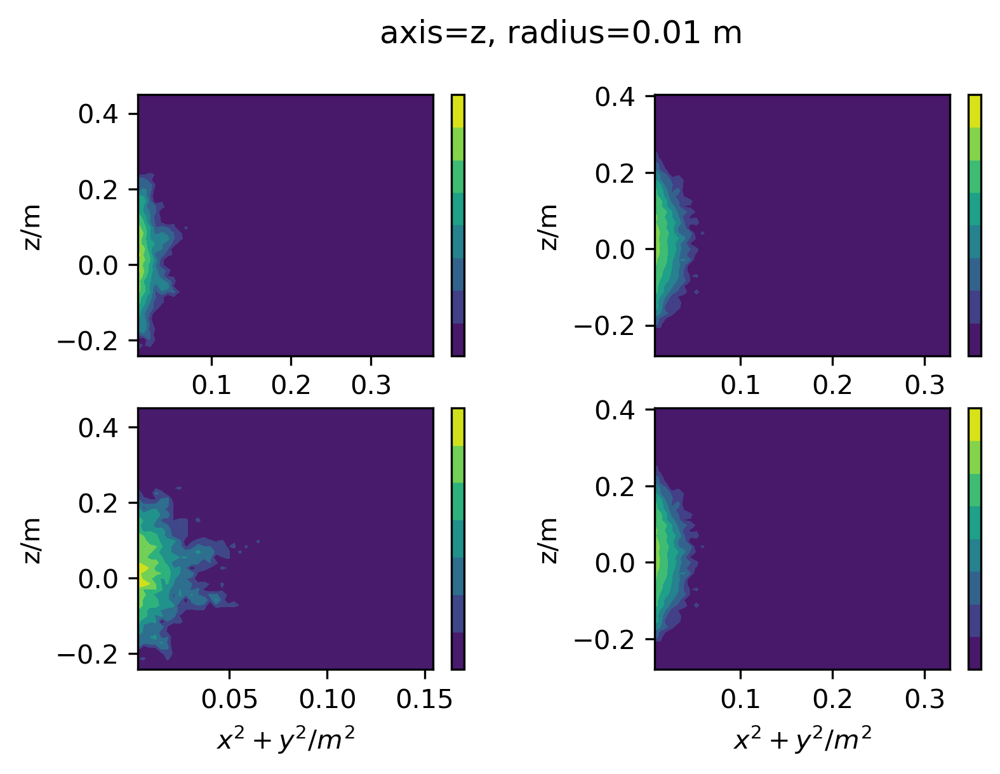

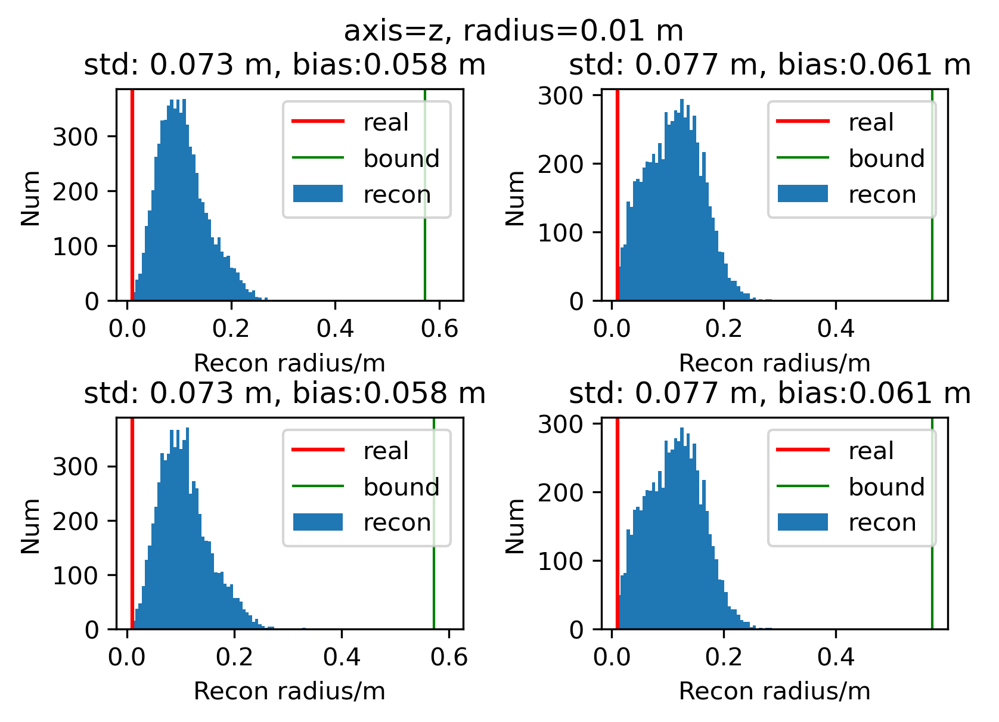

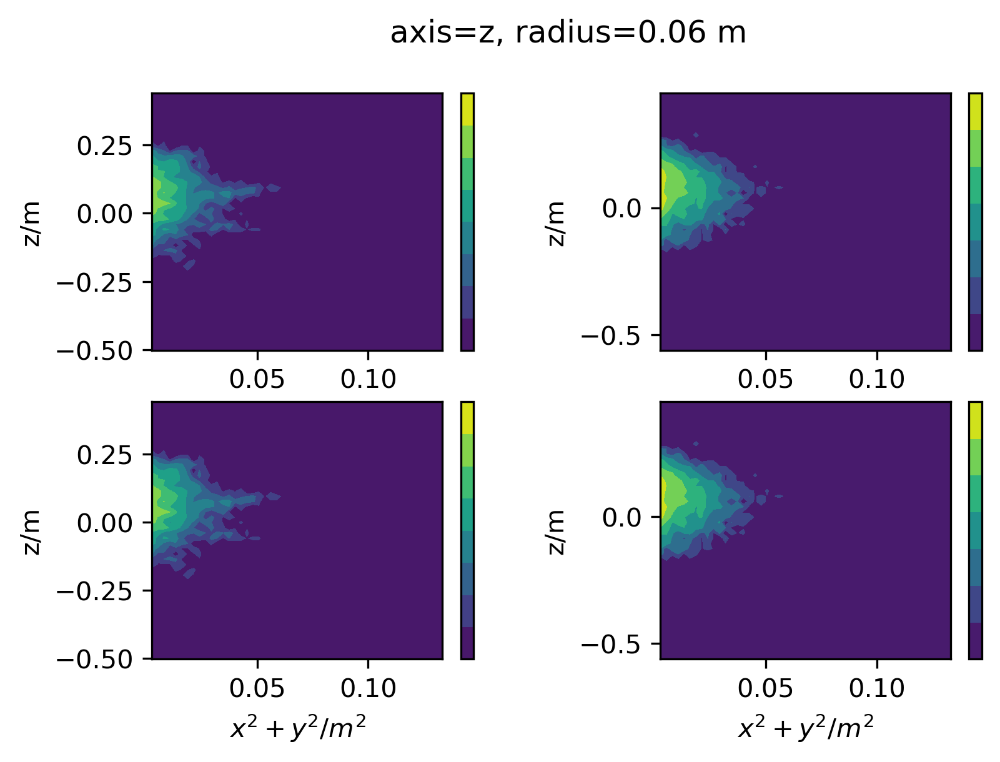

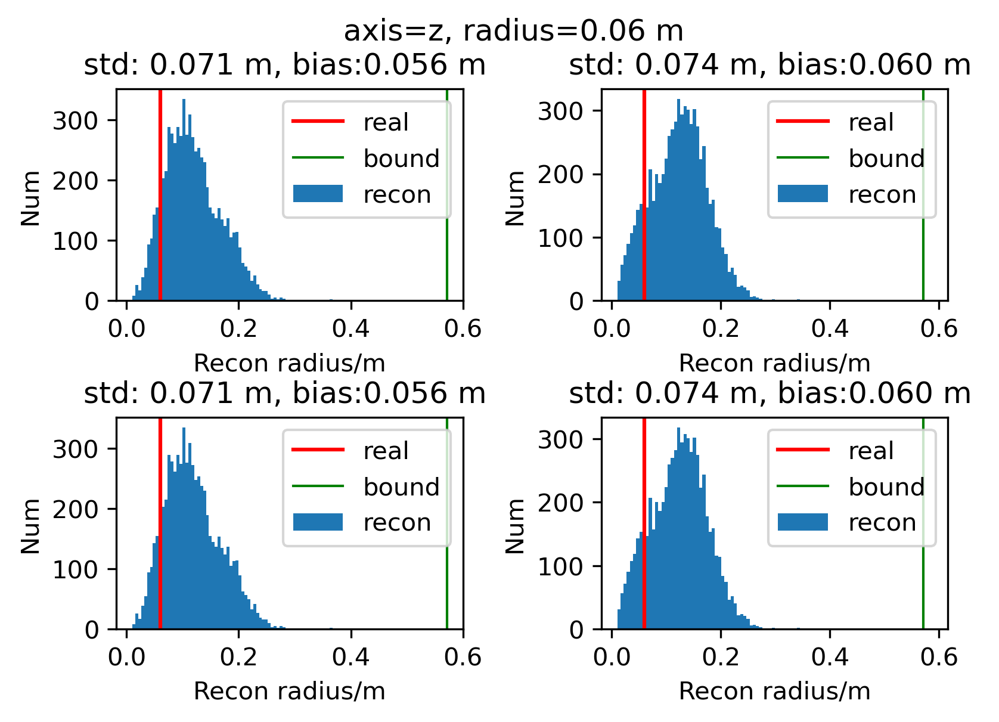

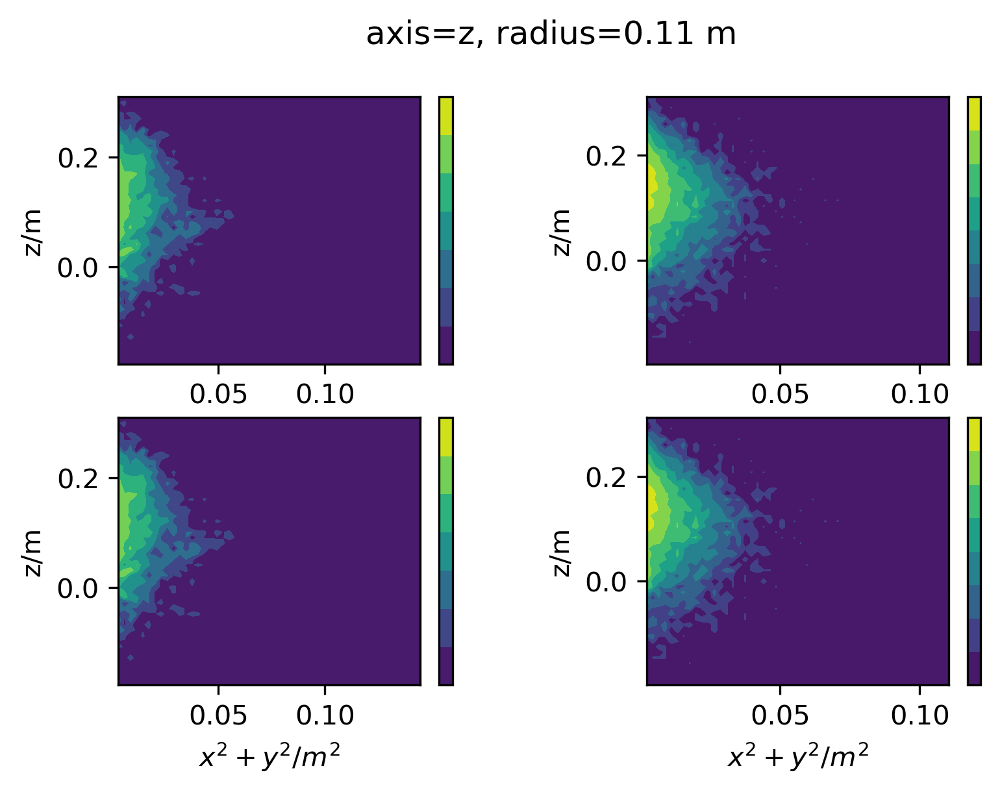

...

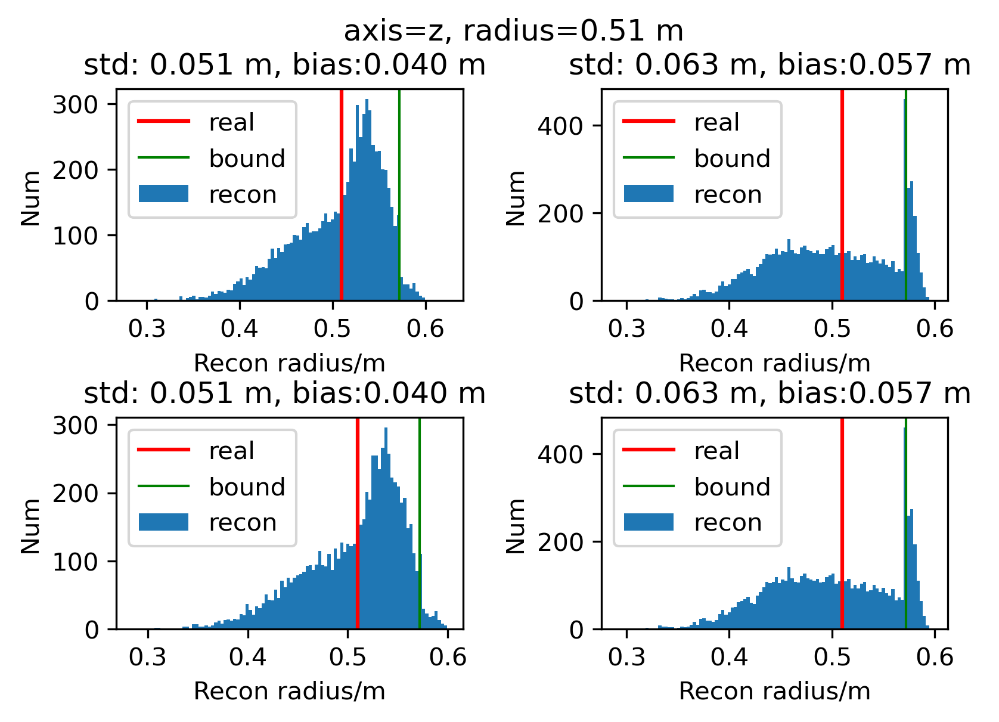

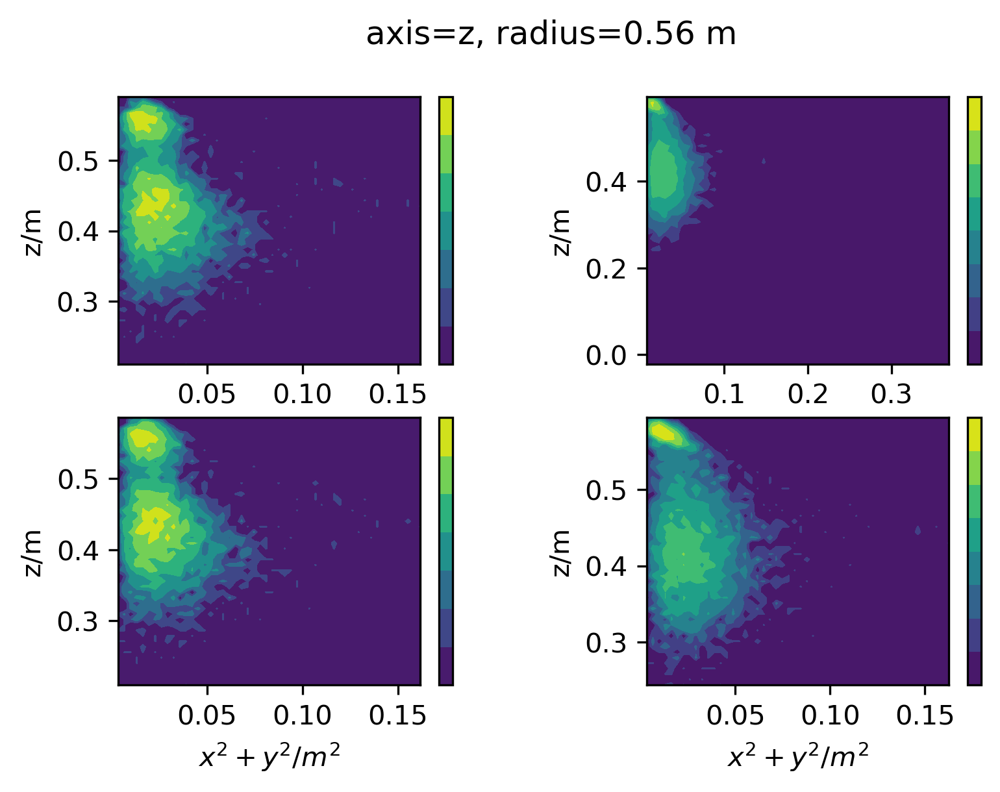

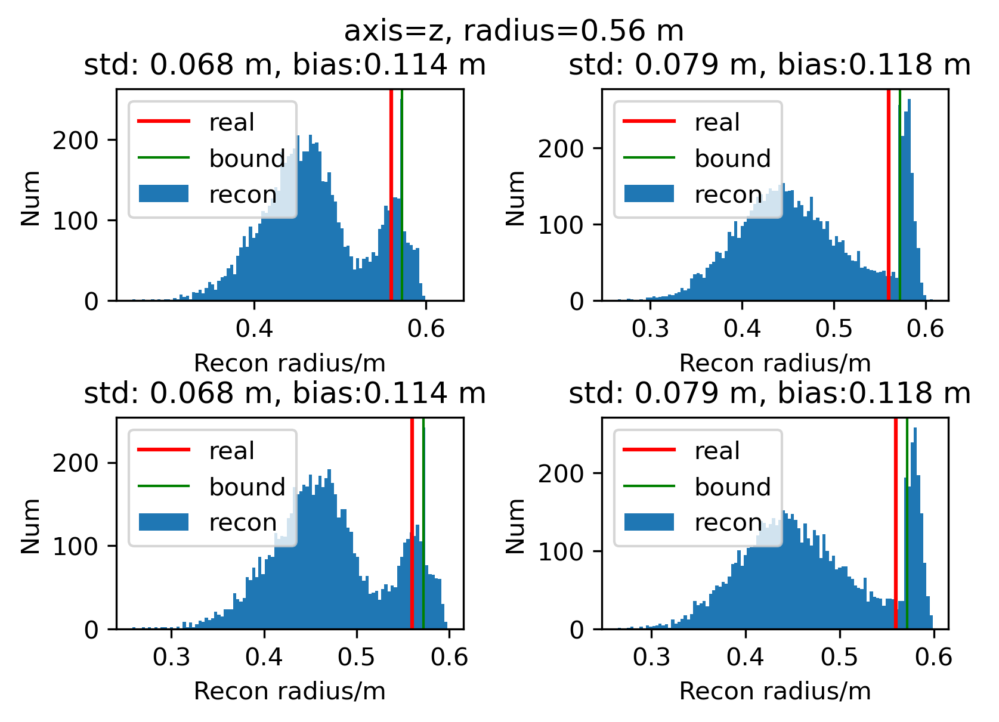

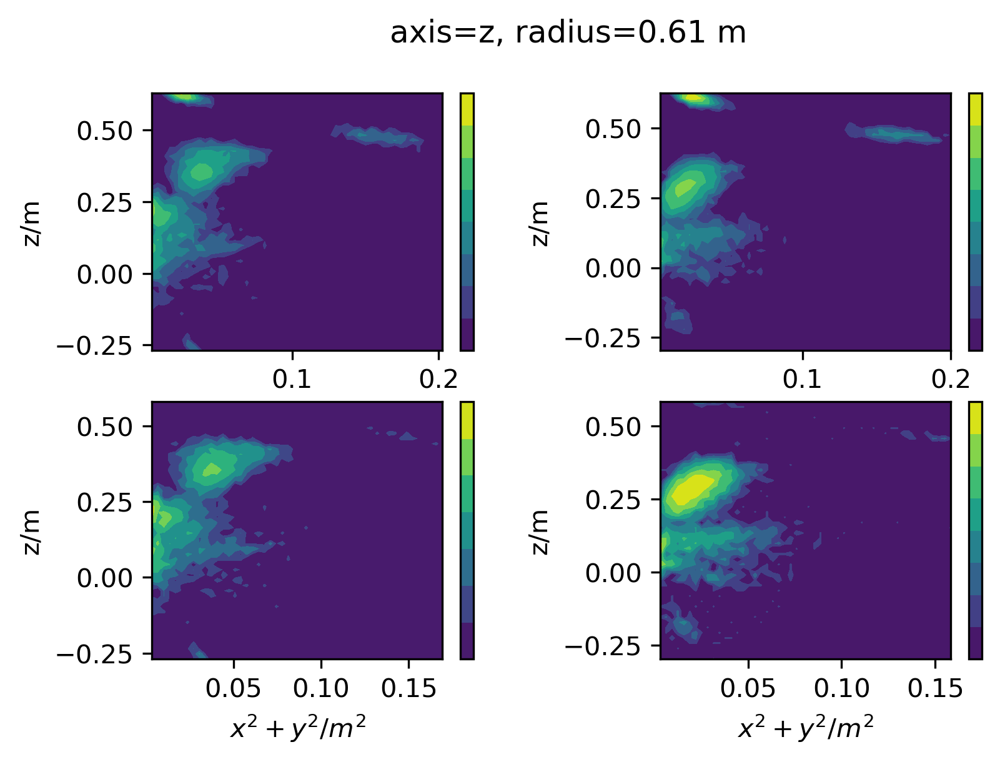

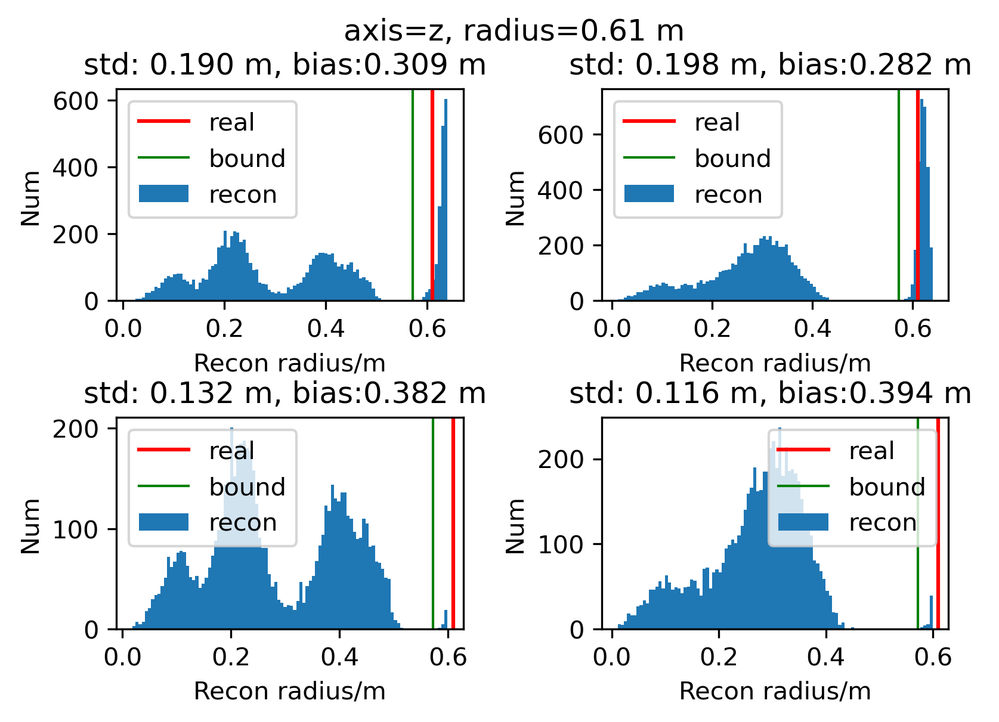

In [15]:
# example of read 1 file
def main(path1,path2,axis):
    for i,file in enumerate(np.arange(0.01,0.65,0.05)):

        h = tables.open_file('../%s/1t_%+.3f_%s.h5' % (path1, file, axis),'r')
        recondata = h.root.Recon
        E1 = recondata[:]['E_sph_in']
        x1 = recondata[:]['x_sph_in']
        y1 = recondata[:]['y_sph_in']
        z1 = recondata[:]['z_sph_in']
        L1 = recondata[:]['Likelihood_in']
        s1 = recondata[:]['success_in']
        
        E2 = recondata[:]['E_sph_out']
        x2 = recondata[:]['x_sph_out']
        y2 = recondata[:]['y_sph_out']
        z2 = recondata[:]['z_sph_out']
        L2 = recondata[:]['Likelihood_out']
        s2 = recondata[:]['success_out']

        data = np.zeros((np.size(x1),3))
        
        index = L1 < L2
        data[index,0] = x1[index]
        data[index,1] = y1[index]
        data[index,2] = z1[index]

        data[~index,0] = x2[~index]
        data[~index,1] = y2[~index]
        data[~index,2] = z2[~index]

        xt = recondata[:]['x_truth'][0]
        yt = recondata[:]['y_truth'][0]
        zt = recondata[:]['z_truth'][0]
        h.close()
        x = data[(s1 * s2)!=0,0]
        y = data[(s1 * s2)!=0,1]
        z = data[(s1 * s2)!=0,2]
        
        fig = plt.figure(num=i*2+1, dpi=300)
        plt.subplots_adjust(wspace=0.4)
        ax = plt.subplot(2,2,1)
        ax.tick_params(axis='both', which='minor', labelsize=8)
        r = np.sqrt(x**2 + y**2 + z**2)
        index = (r<0.64) & (r>0.01) & (~np.isnan(r))
        H1, xedges, yedges = np.histogram2d(x[index]**2 + y[index]**2, z[index], bins=50)
        X, Y = np.meshgrid(xedges[1:],yedges[1:])
        plt.contourf(X,Y,np.log(np.transpose(H1)+1))
        cbar = plt.colorbar()
        cbar.set_ticks([])
        
        plt.xlabel(r'$x^2 + y^2/m^2$')
        plt.ylabel('z/m')
        ax = plt.subplot(2,2,3)
        ax.tick_params(axis='both', which='minor', labelsize=8)
        r = np.sqrt(x**2 + y**2 + z**2)
        index = (r<0.60) & (r>0.01) & (~np.isnan(r))
        H1, xedges, yedges = np.histogram2d(x[index]**2 + y[index]**2, z[index], bins=50)
        X, Y = np.meshgrid(xedges[1:],yedges[1:])
        plt.contourf(X,Y,np.log(np.transpose(H1)+1))
        cbar = plt.colorbar()
        cbar.set_ticks([])
        plt.xlabel(r'$x^2 + y^2/m^2$')
        plt.ylabel('z/m')

        fig = plt.figure(num=i*2+2, dpi=300)
        plt.subplots_adjust(wspace=0.4, hspace=0.55)
        ax = plt.subplot(2,2,1)
        ax.tick_params(axis='both', which='minor', labelsize=8)
        index = (r<0.64) & (r>0.01) & (~np.isnan(r))
        plt.hist(np.sqrt(x[index]**2+y[index]**2+z[index]**2), bins=100,label='recon')
        plt.axvline(np.abs(file), color='red', label='real')
        plt.axvline(0.88 * 0.65,color='green',linewidth=1,label='bound')
        plt.xlabel('Recon radius/m')
        plt.ylabel('Num')
        recon = eval(axis)
        plt.title('std: %.3f m, bias:%.3f m ' % (np.std(recon[index]-file), np.mean(np.abs(recon[index]-file))))
        plt.legend()
        
        ax = plt.subplot(2,2,3)
        ax.tick_params(axis='both', which='minor', labelsize=8)
        index = (r<0.60) & (r>0.01) & (~np.isnan(r))
        plt.hist(np.sqrt(x[index]**2+y[index]**2+z[index]**2), bins=100,label='recon')
        plt.axvline(np.abs(file), color='red', label='real')
        plt.axvline(0.88 * 0.65,color='green',linewidth=1,label='bound')
        plt.xlabel('Recon radius/m')
        plt.ylabel('Num')
        recon = eval(axis)
        plt.title('std: %.3f m, bias:%.3f m ' % (np.std(recon[index]-file), np.mean(np.abs(recon[index]-file))))
        plt.legend()
        ###############################
        ###############################
        ###############################
        h = tables.open_file('../%s/1t_%+.3f_%s.h5' % (path2, file, axis),'r')
        recondata = h.root.Recon
        E1 = recondata[:]['E_sph_in']
        x1 = recondata[:]['x_sph_in']
        y1 = recondata[:]['y_sph_in']
        z1 = recondata[:]['z_sph_in']
        L1 = recondata[:]['Likelihood_in']
        s1 = recondata[:]['success_in']
        
        E2 = recondata[:]['E_sph_out']
        x2 = recondata[:]['x_sph_out']
        y2 = recondata[:]['y_sph_out']
        z2 = recondata[:]['z_sph_out']
        L2 = recondata[:]['Likelihood_out']
        s2 = recondata[:]['success_out']

        data = np.zeros((np.size(x1),3))
        
        index = L1 < L2
        data[index,0] = x1[index]
        data[index,1] = y1[index]
        data[index,2] = z1[index]

        data[~index,0] = x2[~index]
        data[~index,1] = y2[~index]
        data[~index,2] = z2[~index]

        xt = recondata[:]['x_truth'][0]
        yt = recondata[:]['y_truth'][0]
        zt = recondata[:]['z_truth'][0]
        h.close()
        x = data[(s1 * s2)!=0,0]
        y = data[(s1 * s2)!=0,1]
        z = data[(s1 * s2)!=0,2]
        
        fig = plt.figure(num=i*2+1)
        ax = plt.subplot(2,2,2)
        ax.tick_params(axis='both', which='minor', labelsize=8)
        r = np.sqrt(x**2 + y**2 + z**2)
        index = (r<0.64) & (r>0.01) & (~np.isnan(r))
        H1, xedges, yedges = np.histogram2d(x[index]**2 + y[index]**2, z[index], bins=50)
        X, Y = np.meshgrid(xedges[1:],yedges[1:])
        plt.contourf(X,Y,np.log(np.transpose(H1)+1))
        cbar = plt.colorbar()
        cbar.set_ticks([])
        plt.xlabel(r'$x^2 + y^2/m^2$')
        plt.ylabel('z/m')
        
        ax = plt.subplot(2,2,4)
        ax.tick_params(axis='both', which='minor', labelsize=8)
        r = np.sqrt(x**2 + y**2 + z**2)
        index = (r<0.60) & (r>0.01) & (~np.isnan(r))
        H1, xedges, yedges = np.histogram2d(x[index]**2 + y[index]**2, z[index], bins=50)
        X, Y = np.meshgrid(xedges[1:],yedges[1:])
        plt.contourf(X,Y,np.log(np.transpose(H1)+1))
        cbar = plt.colorbar()
        cbar.set_ticks([])
        plt.xlabel(r'$x^2 + y^2/m^2$')
        plt.ylabel('z/m')
        fig.suptitle(f'axis=%s, radius=%.2f m ' % (axis, file))
        plt.savefig('./fig/Scatter_2MeV%+.2f_%s.pdf' % (file,axis))        
        fig = plt.figure(num=i*2+2)
        ax = plt.subplot(2,2,2)
        ax.tick_params(axis='both', which='minor', labelsize=8)
        index = (r<0.64) & (r>0.01) & (~np.isnan(r))
        plt.hist(np.sqrt(x[index]**2+y[index]**2+z[index]**2), bins=100,label='recon')
        plt.axvline(np.abs(file), color='red', label='real')
        plt.axvline(0.88 * 0.65,color='green',linewidth=1,label='bound')
        plt.xlabel('Recon radius/m')
        plt.ylabel('Num')
        plt.legend()
        recon = eval(axis)
        plt.title('std: %.3f m, bias:%.3f m ' % (np.std(recon[index]-file), np.mean(np.abs(recon[index]-file))))
        
        ax = plt.subplot(2,2,4)
        ax.tick_params(axis='both', which='minor', labelsize=8)
        index = (r<0.60) & (r>0.01) & (~np.isnan(r))
        plt.hist(np.sqrt(x[index]**2+y[index]**2+z[index]**2), bins=100,label='recon')
        plt.axvline(np.abs(file), color='red', label='real')
        plt.axvline(0.88 * 0.65,color='green',linewidth=1,label='bound')
        plt.xlabel('Recon radius/m')
        plt.ylabel('Num')
        plt.legend()
        recon = eval(axis)
        plt.title('std: %.3f m, bias:%.3f m ' % (np.std(recon[index]-file), np.mean(np.abs(recon[index]-file))))        
        fig.suptitle(f'axis=%s, radius=%.2f m ' % (axis, file))
        plt.savefig('./fig/HistR_2MeV%+.2f_%s.pdf' % (file,axis))
        #plt.show()
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','x')
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','y')
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','z')

#main('result_1t_2.0MeV_dns_Recon_1t_10','result_1t_2.0MeV_dns','x')
#main('result_1t_2.0MeV_dns_Recon_1t_10','result_1t_2.0MeV_dns','y')
main('result_1t_2.0MeV_dns_Recon_1t_2','result_1t_2.0MeV_dns','z')

0.03868668668466175


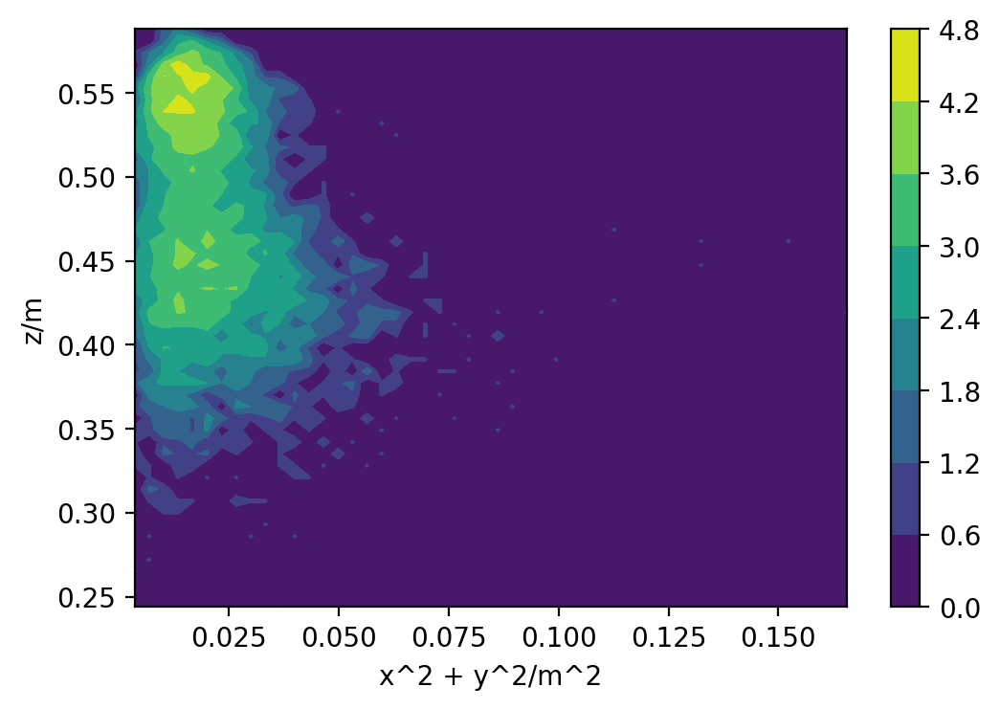

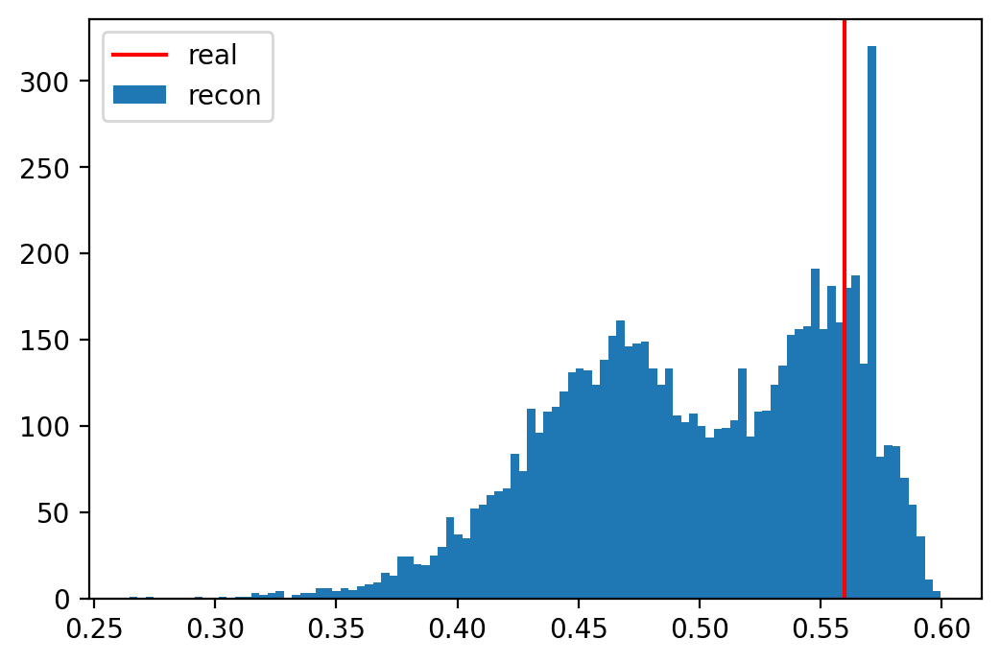

In [32]:
# example of read 1 file
def main(path):
        h = tables.open_file(path,'r')
        recondata = h.root.Recon
        E1 = recondata[:]['E_sph_in']
        x1 = recondata[:]['x_sph_in']
        y1 = recondata[:]['y_sph_in']
        z1 = recondata[:]['z_sph_in']
        L1 = recondata[:]['Likelihood_in']
        s1 = recondata[:]['success_in']
        
        E2 = recondata[:]['E_sph_out']
        x2 = recondata[:]['x_sph_out']
        y2 = recondata[:]['y_sph_out']
        z2 = recondata[:]['z_sph_out']
        L2 = recondata[:]['Likelihood_out']
        s2 = recondata[:]['success_out']
        
        data = np.zeros((np.size(x1),3))
        
        index = L1 < L2
        data[index,0] = x1[index]
        data[index,1] = y1[index]
        data[index,2] = z1[index]

        data[~index,0] = x2[~index]
        data[~index,1] = y2[~index]
        data[~index,2] = z2[~index]

        xt = recondata[:]['x_truth'][0]
        yt = recondata[:]['y_truth'][0]
        zt = recondata[:]['z_truth'][0]

        x = data[(s1 * s2)!=0,0]
        y = data[(s1 * s2)!=0,1]
        z = data[(s1 * s2)!=0,2]
        
        
        r = np.sqrt(x**2 + y**2 + z**2)
        index = (r<0.60) & (r>0.01) & (~np.isnan(r))
        H1, xedges, yedges = np.histogram2d(x[index]**2 + y[index]**2, z[index], bins=50)
        X, Y = np.meshgrid(xedges[1:],yedges[1:])
        plt.figure(dpi=200)
        plt.contourf(X,Y,np.log(np.transpose(H1)+1))
        plt.colorbar()
        plt.xlabel('x^2 + y^2/m^2')
        plt.ylabel('z/m')

        #index1 = (~index) & (~np.isnan(x2))
        #plt.hist(np.nan_to_num(np.sqrt(data[index1,0]**2 + data[index1,1]**2 + data[index1,2]**2)),bins=100)
        #plt.show()
        plt.figure(dpi=200)
        index2 = index
        #index2 = index
        plt.hist(np.sqrt(x[index2]**2+y[index2]**2+z[index2]**2), bins=100,label='recon')
        plt.axvline(0.56,color='red',label='real')
        print(np.std(y[index2]))
        plt.legend()
        #plt.show()
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','x')
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','y')
#main('result_1t_2.0MeV_dns_Recon_1t_shell_cubic','z')

#main('/home/douwei/Recon1t/Recon1tonSim/result_1t_2.0MeV_dns_Recon_1t_10/1t_+0.350_x.h5')
main('../z550_10_10.h5')
#main('/home/douwei/Recon1t/Recon1tonSim/result_1t_2.0MeV_dns/1t_-0.550_z.h5')

In [17]:
# example of read 1 file
def main(path):
        h = tables.open_file(path,'r')
        recondata = h.root.Recon
        E1 = recondata[:]['E_sph_in']
        x1 = recondata[:]['x_sph_in']
        y1 = recondata[:]['y_sph_in']
        z1 = recondata[:]['z_sph_in']
        L1 = recondata[:]['Likelihood_in']
        s1 = recondata[:]['success_in']
        
        E2 = recondata[:]['E_sph_out']
        x2 = recondata[:]['x_sph_out']
        y2 = recondata[:]['y_sph_out']
        z2 = recondata[:]['z_sph_out']
        L2 = recondata[:]['Likelihood_out']
        s2 = recondata[:]['success_out']
        
        data = np.zeros((np.size(x1),3))
        
        index = L1 < L2
        data[index,0] = x1[index]
        data[index,1] = y1[index]
        data[index,2] = z1[index]

        data[~index,0] = x2[~index]
        data[~index,1] = y2[~index]
        data[~index,2] = z2[~index]

        xt = recondata[:]['x_truth'][0]
        yt = recondata[:]['y_truth'][0]
        zt = recondata[:]['z_truth'][0]

        x = data[(s1 * s2)!=0,0]
        y = data[(s1 * s2)!=0,1]
        z = data[(s1 * s2)!=0,2]
        
        
        r = np.sqrt(x**2 + y**2 + z**2)
        index = (r<0.60) & (r>0.01) & (~np.isnan(r))
        print(np.std(z[index]), np.mean(z[index]))
#main('/home/douwei/Recon1t/Recon1tonSim/result_1t_2.0MeV_dns/1t_+0.560_z.h5')
#main('/home/douwei/Recon1t/Recon1tonSim/result_1t_2.0MeV_dns_Recon_1t_10_old/1t_+0.560_z.h5')
#main('/home/douwei/Recon1t/Recon1tonSim/result_1t_2.0MeV_dns_Recon_1t_10/1t_+0.560_z.h5')
fuck = '-0.550_z'
main('/home/douwei/Recon1t/Recon1tonSim/result_1t_2.0MeV_dns/1t_%s.h5' % fuck)
main('/home/douwei/Recon1t/Recon1tonSim/result_1t_2.0MeV_dns_Recon_1t_10_old/1t_%s.h5' % fuck)

0.07260067640118097 -0.4762639871442946
0.06396482634019134 -0.4807746154440325


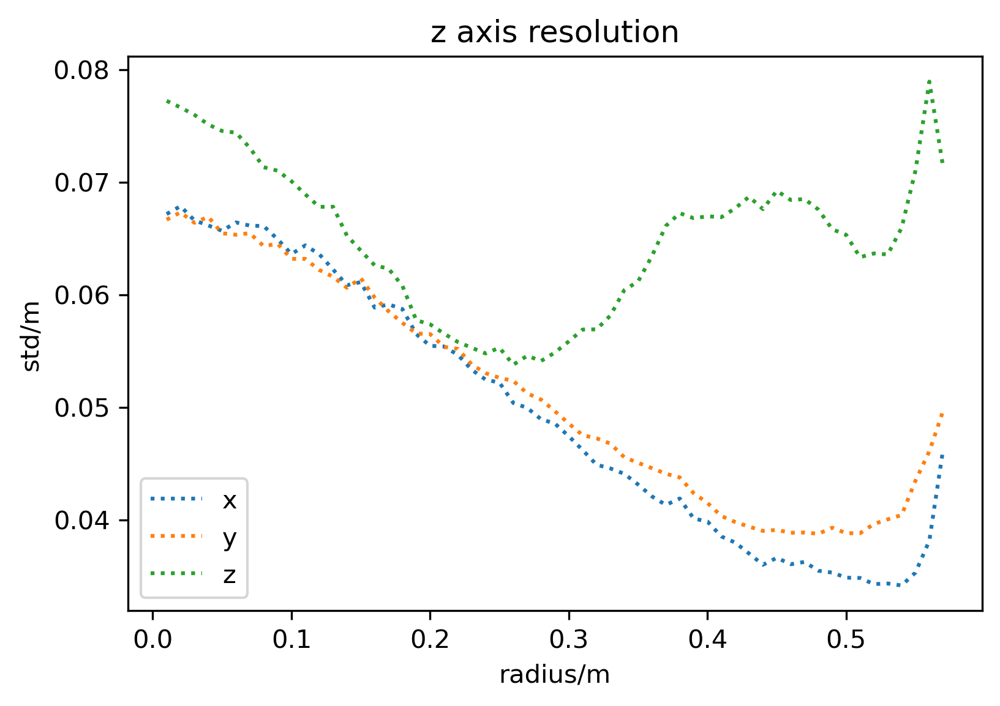

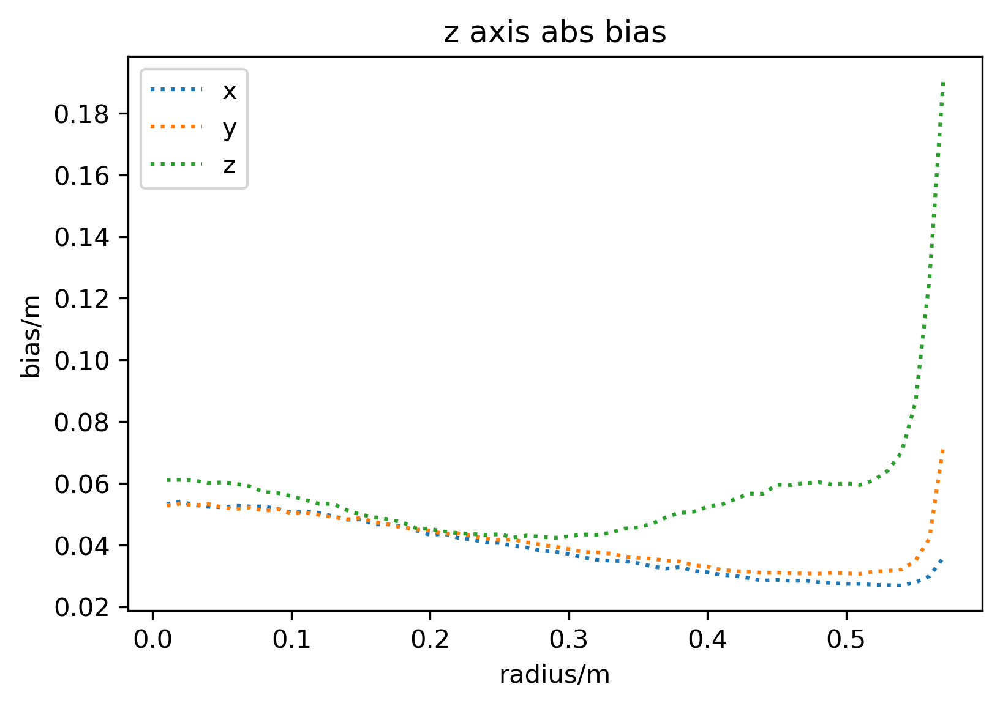

In [189]:
# example of read 1 file
def main(radius):
    h = tables.open_file('/home/douwei/Recon1t/Recon1tonSim/result_1t_2.0MeV_dns/1t_%+.3f_z.h5' % radius,'r')
    recondata = h.root.Recon
    E1 = recondata[:]['E_sph_in']
    x1 = recondata[:]['x_sph_in']
    y1 = recondata[:]['y_sph_in']
    z1 = recondata[:]['z_sph_in']
    L1 = recondata[:]['Likelihood_in']
    s1 = recondata[:]['success_in']

    E2 = recondata[:]['E_sph_out']
    x2 = recondata[:]['x_sph_out']
    y2 = recondata[:]['y_sph_out']
    z2 = recondata[:]['z_sph_out']
    L2 = recondata[:]['Likelihood_out']
    s2 = recondata[:]['success_out']

    data = np.zeros((np.size(x1),3))

    index = L1 < L2
    data[index,0] = x1[index]
    data[index,1] = y1[index]
    data[index,2] = z1[index]

    data[~index,0] = x2[~index]
    data[~index,1] = y2[~index]
    data[~index,2] = z2[~index]

    xt = recondata[:]['x_truth'][0]
    yt = recondata[:]['y_truth'][0]
    zt = recondata[:]['z_truth'][0]

    x = data[(s1 * s2)!=0,0]
    y = data[(s1 * s2)!=0,1]
    z = data[(s1 * s2)!=0,2]


    r = np.sqrt(x**2 + y**2 + z**2)
    index = (r<0.60) & (r>0.01) & (~np.isnan(r))
    return np.std(x[index]), np.std(y[index]-yt), np.std(z[index]-zt),\
        np.mean(np.abs(x[index])),np.mean(np.abs(y[index]-radius*np.sqrt(26)/25)),np.mean(np.abs(z[index]-radius*np.sqrt(26)/5))

A = []
ra = np.arange(0.01,0.58,0.01)
for i in ra:
    A.append(main(i))
A = np.array(A)
plt.figure(num=1, dpi=300)
plt.plot(ra, A[:,0],label='x',linestyle='dotted')
plt.plot(ra, A[:,1],label='y',linestyle='dotted')
plt.plot(ra, A[:,2],label='z',linestyle='dotted')
plt.xlabel('radius/m')
plt.ylabel('std/m')
plt.legend()
plt.title('z axis resolution')
plt.savefig('zres.png')
plt.figure(num=2, dpi=300)
plt.plot(ra, A[:,3],label='x',linestyle='dotted')
plt.plot(ra, A[:,4],label='y',linestyle='dotted')
plt.plot(ra, A[:,5],label='z',linestyle='dotted')
plt.xlabel('radius/m')
plt.ylabel('bias/m')
plt.legend()
plt.title('z axis abs bias')
plt.savefig('zbias.png')